In [1]:
# COMENZAMOS CON EL ENTRENAMIENTO DE LOS MODELOSfrom sklearn.model_selection import train_test_split

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sys import path
sys.path.append('C:\\Users\\Laura\\Desktop\\Nueva carpeta\\Code\\util')

from funciones import graficos_conf_matrix


from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, accuracy_score,confusion_matrix,recall_score, f1_score
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline


import pickle
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

In [2]:
# IMPORTAMOS EL CSV YA LIMPIO .
# LO VAMOS A DIVIDIR EN DOS, UNA PARTE PARA EL ENTRENAMIENTO-PREDICCIONES Y OTRA PARTE PARA EL TEST, COMO SI DE DATOS REALES SE TRATARAN


data_train = pd.read_csv('../Data/Processed/data_processed.csv', index_col=0)

data_train = data_train.iloc[:int(data_train.shape[0]*60/100), :]
data_test = data_train.iloc[int(data_train.shape[0]*60/100) : , :]

In [3]:
# DIVIDIMOS EN DATA_TRAIN EN TRAIN Y TEST


X_train, X_test, y_train, y_test = train_test_split(data_train.drop(columns=['Target','Anxiety','Stress'], axis=1), data_train.Target, random_state=0, test_size=0.20, shuffle=True)



XGBOOST

In [5]:

# 
# CREACION DE PIPELINE INICIAL.
# HACEMOS UN GRIDSEARCH CON CROSS VALIDATIION
# LO INSTANCIAMOS

model_xgb = Pipeline (steps = [
                     ('scaler', MinMaxScaler()),
                     ('xgb', XGBClassifier())]
                    )  


params = {'xgb__eval_metric' : ['logloss','error'],
          'xgb__max_depth' : range(3,10),
          'xgb__min_child_weight': range(1,50),
          'xgb__alpha': np.arange(0,0.5),
          'xgb__scale_pos_weight': range(0,10),
          'xgb__eta': np.arange(0,0.3)# este no puede ser cero nunca porque si no no aprende
         }


model_xgb_gtc = GridSearchCV(model_xgb, params, cv=5, scoring='recall')
model_xgb_gtc.fit(X_train, y_train)

C:\Users\Laura\AppData\Local\Programs\Python\Python37\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Laura\AppData\Local\Programs\Python\Python37\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Laura\AppData\Local\Progr

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('xgb',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      enable_categorical=False,
                                                      gamma=None, gpu_id=None,
                                                      importance_type=None,
                                                      interaction_constraints=None,
                                                      learning_rate=None,
                                                      max_delta_step=None,
                            

In [6]:
# SACAMOS LOS MEJORES PARÁMETROS PARA ENTRENAR EL MODELO

print (model_xgb_gtc.best_params_)
print (model_xgb_gtc.best_estimator_)

{'xgb__alpha': 0.0, 'xgb__eta': 0.0, 'xgb__eval_metric': 'logloss', 'xgb__max_depth': 3, 'xgb__min_child_weight': 1, 'xgb__scale_pos_weight': 0}
Pipeline(steps=[('scaler', MinMaxScaler()),
                ('xgb',
                 XGBClassifier(alpha=0.0, base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               eta=0.0, eval_metric='logloss', gamma=0,
                               gpu_id=-1, importance_type=None,
                               interaction_constraints='', learning_rate=0,
                               max_delta_step=0, max_depth=3,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=8, num_parallel_tree=1, predictor='auto',
                               random_state=0, reg_alpha=0, reg_lamb

In [7]:
#CREAMOS UN NUEVO PIPELINE CON EL RESULTADO MEJOR RESULTADO DEL GRIDSEARCH
model_xgb_V0 = model_xgb_gtc.best_estimator_

In [8]:
model_xgb_V0

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('xgb',
                 XGBClassifier(alpha=0.0, base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               eta=0.0, eval_metric='logloss', gamma=0,
                               gpu_id=-1, importance_type=None,
                               interaction_constraints='', learning_rate=0,
                               max_delta_step=0, max_depth=3,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=8, num_parallel_tree=1, predictor='auto',
                               random_state=0, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=0, subsample=1,
                               tree_method='exact', validate_parameters=1, 

In [9]:
# ENTRENAMOS EL MODELO Y SACAMOS LAS PREDICCIONES

model_xgb_V0.fit(X_train,y_train)
y_predi = model_xgb_V0.predict(X_test)

C:\Users\Laura\AppData\Local\Programs\Python\Python37\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


In [10]:
# PASAMOS LAS METRICAS A UN DATAFRAM

df_scores = pd.read_csv('../Model/scores_models_Recall.csv', index_col=0)
df_scores['xgb_data_train'] =[recall_score(y_test,y_predi), roc_auc_score(y_test,y_predi),  accuracy_score(y_test, y_predi), f1_score(y_test, y_predi)]


df_scores

,log_re_data_train,log_re_test,knn_data_train,knn_data_test,xgb_data_train
Recall,0.892715,0.896218,0.868543,0.866881,0.000000
Auc,0.841965,0.847397,0.850986,0.860818,0.500000
Accuracy,0.855437,0.858894,0.855646,0.862246,0.367274
F1_score,0.886550,0.886968,0.883909,0.886039,0.000000


In [50]:
# GUARDAMOS LA CONFUSION MATRIX PARA DESPUES GRAFICARLA
c_matrix_train = confusion_matrix(y_test, y_predi)

In [12]:
# GUARDAMOS EL MODELO

with open('../Model/model_xgb_V0', 'wb') as archivo_salida:
    pickle.dump(model_xgb_V0, archivo_salida)

In [13]:
# PROBAMOS EL MODELO CON LOS DATOS RESERVADOS PARA VER COMO GENERALIZA

X = data_test.drop(columns=['Target','Anxiety','Stress'], axis=1)
y= data_test.Target

with open('../Model/model_xgb_V0', 'rb') as archivo_entrada:
    loaded_model = pickle.load(archivo_entrada)

In [14]:
loaded_model

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('xgb',
                 XGBClassifier(alpha=0.0, base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               eta=0.0, eval_metric='logloss', gamma=0,
                               gpu_id=-1, importance_type=None,
                               interaction_constraints='', learning_rate=0,
                               max_delta_step=0, max_depth=3,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=8, num_parallel_tree=1, predictor='auto',
                               random_state=0, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=0, subsample=1,
                               tree_method='exact', validate_parameters=1, 

In [15]:
# PASAMOS LAS METRICAS A UN DATAFRAM
df_scores['xgb_data_test'] =[recall_score(y,loaded_model.predict(X)), roc_auc_score(y,loaded_model.predict(X)), accuracy_score(y, loaded_model.predict(X)), f1_score(y, loaded_model.predict(X))]
df_scores.to_csv('../Model/scores_models_Recall.csv')
df_scores

,log_re_data_train,log_re_test,knn_data_train,knn_data_test,xgb_data_train,xgb_data_test
Recall,0.892715,0.896218,0.868543,0.866881,0.000000,0.000000
Auc,0.841965,0.847397,0.850986,0.860818,0.500000,0.500000
Accuracy,0.855437,0.858894,0.855646,0.862246,0.367274,0.382254
F1_score,0.886550,0.886968,0.883909,0.886039,0.000000,0.000000


In [16]:
# GUARDAMOS LA CONFUSION MATRIX PARA DESPUES GRAFICARLA
c_matrix_test = confusion_matrix(y,loaded_model.predict(X))

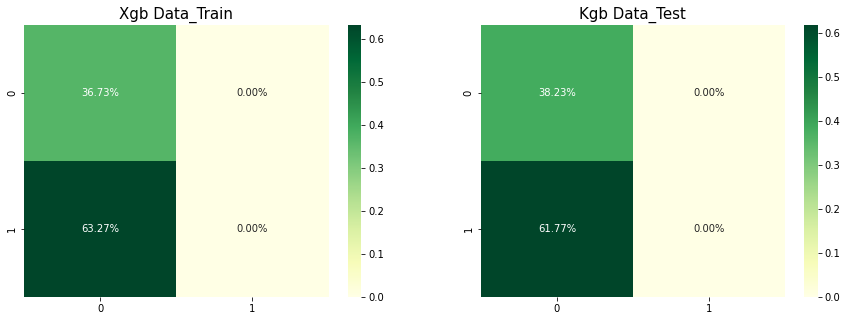

In [17]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
graficos_conf_matrix(c_matrix_train,'Xgb Data_Train')
plt.subplot(1,2,2)
graficos_conf_matrix(c_matrix_test,'Kgb Data_Test')

In [ ]:
#DESPUES DE VER LOS RESULTADOS 
# PROBAMOS AHORA CON UN RANDOMIZEDSEARCHCV
# CREACION DE PIPELINE INICIAL.
# HACEMOS UN GRIDSEARCH CON CROSS VALIDATIION
# LO INSTANCIAMOS

model_xgb = Pipeline (steps = [
                     ('scaler', MinMaxScaler()),
                     ('xgb', XGBClassifier())]
                    )  


params = {
          'xgb__max_depth' : range(3,10),
          'xgb__min_child_weight': range(1,50,3),
          'xgb__alpha': np.arange(0,0.5,0.1),
          'xgb__eta': np.arange(0.1,0.3,0.1)
         }


model_xgb_rsc = RandomizedSearchCV(model_xgb, params, cv=5, scoring='recall',n_iter= 100)
model_xgb_rsc.fit(X_train, y_train)

In [55]:
print (model_xgb_rsc.best_params_)
print (model_xgb_rsc.best_estimator_)
model_xgb_rsc.best_score_

{'xgb__min_child_weight': 49, 'xgb__max_depth': 6, 'xgb__eta': 0.1, 'xgb__alpha': 0.2}
Pipeline(steps=[('scaler', MinMaxScaler()),
                ('xgb',
                 XGBClassifier(alpha=0.2, base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               eta=0.1, gamma=0, gpu_id=-1,
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.100000001, max_delta_step=0,
                               max_depth=6, min_child_weight=49, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=8, num_parallel_tree=1, predictor='auto',
                               random_state=0, reg_alpha=0.200000003,
                               reg_lambda=1, scale_pos_weight=1, subsample=1,
                     

0.8669596815351639

In [ ]:
#CREAMOS UN NUEVO PIPELINE CON EL RESULTADO MEJOR RESULTADO DEL GRIDSEARCH
model_xgb_V0 = model_xgb_rsc.best_estimator_

In [10]:
model_xgb_V0.fit(X_train,y_train)
y_predi = model_xgb_V0.predict(X_test)

C:\Users\Laura\AppData\Local\Programs\Python\Python37\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:42:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [11]:
# PASAMOS LAS METRICAS A UN DATAFRAM

df_scores = pd.read_csv('../Model/scores_models_Recall.csv', index_col=0)
df_scores['xgb_data_train'] =[recall_score(y_test,y_predi), roc_auc_score(y_test,y_predi),  accuracy_score(y_test, y_predi), f1_score(y_test, y_predi)]


df_scores

,log_re_data_train,log_re_test,knn_data_train,knn_data_test,xgb_data_train,xgb_data_test,rf_train,rf_test
Recall,0.892715,0.896218,0.867219,0.865694,0.853311,0.856876,1.000000,1.000000
Auc,0.841965,0.847397,0.854602,0.862965,0.865332,0.872395,0.500000,0.500000
Accuracy,0.855437,0.858894,0.857951,0.863608,0.862141,0.868741,0.632726,0.617746
F1_score,0.886550,0.886968,0.885396,0.886901,0.886786,0.889691,0.775055,0.763712


In [18]:
# GUARDAMOS LA CONFUSION MATRIX PARA DESPUES GRAFICARLA
c_matrix_train = confusion_matrix(y_test, y_predi)

In [12]:
# GUARDAMOS EL MODELO

with open('../Model/model_xgb_V0', 'wb') as archivo_salida:
    pickle.dump(model_xgb_V0, archivo_salida)

In [13]:
# PROBAMOS EL MODELO CON LOS DATOS RESERVADOS PARA VER COMO GENERALIZA

X = data_test.drop(columns=['Target','Anxiety','Stress'], axis=1)
y= data_test.Target

with open('../Model/model_xgb_V0', 'rb') as archivo_entrada:
    loaded_model = pickle.load(archivo_entrada)

In [14]:
# PASAMOS LAS METRICAS A UN DATAFRAM
df_scores['xgb_data_test'] =[recall_score(y,loaded_model.predict(X)), roc_auc_score(y,loaded_model.predict(X)), accuracy_score(y, loaded_model.predict(X)), f1_score(y, loaded_model.predict(X))]
df_scores.to_csv('../Model/scores_models_Recall.csv')
df_scores

,log_re_data_train,log_re_test,knn_data_train,knn_data_test,xgb_data_train,xgb_data_test,rf_train,rf_test
Recall,0.892715,0.896218,0.867219,0.865694,0.853311,0.850941,1.000000,1.000000
Auc,0.841965,0.847397,0.854602,0.862965,0.865332,0.871072,0.500000,0.500000
Accuracy,0.855437,0.858894,0.857951,0.863608,0.862141,0.866331,0.632726,0.617746
F1_score,0.886550,0.886968,0.885396,0.886901,0.886786,0.887199,0.775055,0.763712


In [16]:
# GUARDAMOS LA CONFUSION MATRIX PARA DESPUES GRAFICARLA
c_matrix_test = confusion_matrix(y,loaded_model.predict(X))

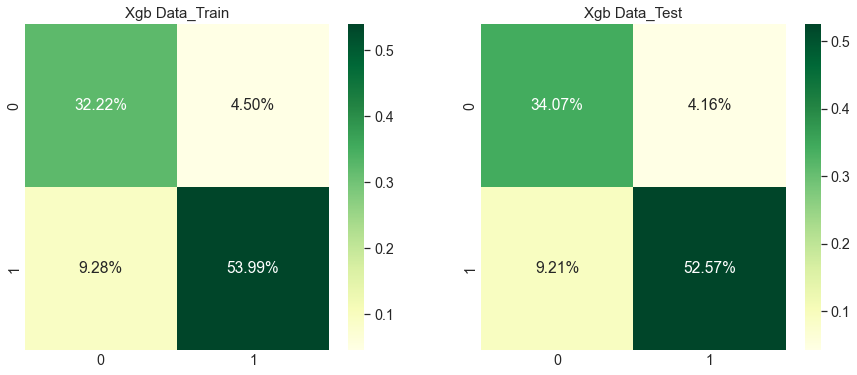

In [20]:
graf_xgb_R_matriz = plt.figure(figsize=(15,6))


plt.style.use('seaborn-whitegrid')
plt.subplot(1,2,1)
sns.set(font_scale = 1.3)
graficos_conf_matrix(c_matrix_train,'Xgb Data_Train')

plt.style.use('seaborn-whitegrid')
plt.subplot(1,2,2)
sns.set(font_scale = 1.3)
graficos_conf_matrix(c_matrix_test,'Xgb Data_Test')

graf_xgb_R_matriz.savefig ('../util/Graficos/graf_xgb_R_matriz.png')